**YOLO** is freely available for redistribution under the [GNU Affero General Public License v3.0](https://github.com/ultralytics/ultralytics/blob/main/LICENSE/).

# **Object Detection - YOLO vX training**

## 1. Setup
Import libraries and check the system

In [2]:
%pip install ultralytics

   ---------------------------------------- 0.0/883.0 kB ? eta -:--:--
   --------------------------------------- 883.0/883.0 kB 13.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
from zipfile import ZipFile
import os

import ultralytics
ultralytics.checks()

from ultralytics import YOLO
import torch
from PIL import Image  # to display images
print(f"Setup complete. Using torch {torch.__version__} on device ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Ultralytics 8.3.7  Python-3.11.9 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Setup complete  (16 CPUs, 31.2 GB RAM, 235.1/466.1 GB disk)
Setup complete. Using torch 2.4.1 on device (NVIDIA GeForce RTX 4050 Laptop GPU)


## 2. Dataset

Download [COCO128](https://www.kaggle.com/ultralytics/coco128), a small 128-image tutorial dataset.

- number of classes: 80
- class names: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
        
Download the dataset to the datastes directory **torch.hub.download_url_to_file(url, name)**

In [ ]:
# %cd ..

In [ ]:
# %cd content

In [4]:
%pwd

'c:\\Users\\msi\\Documents\\ELTE\\DeepNetworkDevelompent\\Lesson4'

In [5]:
if os.path.isdir('datasets')==False: os.mkdir('datasets')

In [ ]:
%cd datasets

/content/datasets


In [ ]:
# Download COCO128

torch.hub.download_url_to_file('https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip', 'tmp.zip')

100%|██████████| 6.66M/6.66M [00:00<00:00, 129MB/s]


In [ ]:
zip = ZipFile('tmp.zip')
zip.extractall()

List all of the training, validation and test images locations.

In [ ]:
#generate training, validation and test lists
path_train = 'coco128/images/train2017/'
path_validation = 'coco128/images/train2017/'
path_test = 'coco128/images/valid2017/'

res=[]
for file in os.listdir(path_train):
    if file.endswith('.jpg'):
        res.append(path_train+file)
with open('train.txt', 'w') as f:
    for line in res:
        f.write(line)
        f.write('\n')
f.close()

res=[]
for file in os.listdir(path_train):
    if file.endswith('.jpg'):
        res.append(path_train+file)
with open('val.txt', 'w') as f:
    for line in res:
        f.write(line)
        f.write('\n')
f.close()

res=[]
for file in os.listdir(path_train):
    if file.endswith('.jpg'):
        res.append(path_train+file)
with open('test.txt', 'w') as f:
    for line in res:
        f.write(line)
        f.write('\n')
f.close()


Create a summary file with the locations and class names

In [ ]:
with open('./test.yaml', 'w') as f:

        f.write("path:  \ntrain: train.txt \nval: val.txt \ntest: test.txt \n")
        #f.write("nc: 80 \n")
        f.write("names:\n  0: person\n  1: bicycle\n  2: car\n  3: motorcycle\n  4: airplane\n  5: bus\n  6: train\n  7: truck\n  8: boat\n  9: traffic light\n  10: fire hydrant\n  11: stop sign\n  12: parking meter\n  13: bench\n  14: bird\n  15: cat\n  16: dog\n  17: horse\n  18: sheep\n  19: cow\n  20: elephant\n  21: bear\n  22: zebra\n  23: giraffe\n  24: backpack\n  25: umbrella\n  26: handbag\n  27: tie\n  28: suitcase\n  29: frisbee\n  30: skis\n  31: snowboard\n  32: sports ball\n  33: kite\n  34: baseball bat\n  35: baseball glove\n  36: skateboard\n  37: surfboard\n  38: tennis racket\n  39: bottle\n  40: wine glass\n  41: cup\n  42: fork\n  43: knife\n  44: spoon\n  45: bowl\n  46: banana\n  47: apple\n  48: sandwich\n  49: orange\n  50: broccoli\n  51: carrot\n  52: hot dog\n  53: pizza\n  54: donut\n  55: cake\n  56: chair\n  57: couch\n  58: potted plant\n  59: bed\n  60: dining table\n  61: toilet\n  62: tv\n  63: laptop\n  64: mouse\n  65: remote\n  66: keyboard\n  67: cell phone\n  68: microwave\n  69: oven\n  70: toaster\n  71: sink\n  72: refrigerator\n  73: book\n  74: clock\n  75: vase\n  76: scissors\n  77: teddy bear\n  78: hair drier\n  79: toothbrush")
        f.write('\n')
f.close()

## 3. Train

Train a YOLOvX model on the [COCO128](https://www.kaggle.com/ultralytics/coco128) dataset with `--datasets test.yaml`, starting from pretrained `yolovXn.pt`, or from randomly initialized weight with architecture configuration `yolovXn.yaml`, optimization parameters `cfg=conf.yaml`.

- **Pretrained [Models](https://docs.ultralytics.com/models/)**

- **[Datasets](https://github.com/ultralytics/yolov5/tree/master/data)** available for autodownload include: [COCO](https://github.com/ultralytics/yolov5/blob/master/data/coco.yaml), [COCO128](https://github.com/ultralytics/yolov5/blob/master/data/coco128.yaml), [VOC](https://github.com/ultralytics/yolov5/blob/master/data/VOC.yaml), [Argoverse](https://github.com/ultralytics/yolov5/blob/master/data/Argoverse.yaml), [VisDrone](https://github.com/ultralytics/yolov5/blob/master/data/VisDrone.yaml), [GlobalWheat](https://github.com/ultralytics/yolov5/blob/master/data/GlobalWheat2020.yaml), [xView](https://github.com/ultralytics/yolov5/blob/master/data/xView.yaml), [Objects365](https://github.com/ultralytics/yolov5/blob/master/data/Objects365.yaml), [SKU-110K](https://github.com/ultralytics/yolov5/blob/master/data/SKU-110K.yaml).
- **Training Results** are saved to `runs/detect/train` with incrementing run directories, i.e. `runs/detect/train2`, `runs/detect/train3` etc.
**Parameter summary from the class:**
Config file: https://github.com/ultralytics/ultralytics/tree/main/ultralytics/cfg/models/v10

Optimization parameters: https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/default.yaml

<br><br>

In [ ]:
%load_ext tensorboard

In [ ]:
#For visualizing training process
#from tensorboard import notebook
# Tensorboard (optional)

#%reload_ext tensorboard # if alredy loaded
# if it still not working cmd.exe:
# taskkill /im tensorboard.exe /f
# del /q %TMP%\.tensorboard-info\*
%tensorboard --logdir Labor/Test --host localhost

#notebook.display(port = 6006, height = 1000)

<IPython.core.display.Javascript object>

### Usage example with the pretrained model and the output

In [ ]:
# Load a model
#model = YOLO("yolo11n.yaml")  # build a new model from scratch
model = YOLO("yolo11n.pt")  # load a pretrained model (recommended for training)
# Print model
# model

100%|██████████| 5.35M/5.35M [00:00<00:00, 217MB/s]


In [ ]:
import urllib.request
imgURL = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxMSEhUUExMVFRUXGBgYGBgYGB0bGhodIB4aGB0dHRoYHSggHRolHRgaITEhJSkrLi4uGCEzODMtNygtLisBCgoKDg0OGxAQGy0lHyUtLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0rLf/AABEIAMEBBgMBIgACEQEDEQH/xAAcAAACAgMBAQAAAAAAAAAAAAAEBQMGAAIHAQj/xABCEAABAwIEAwUFBgQFBAMBAQABAgMRACEEEjFBBVFhBhMicYEykaGx8AcUI0LB0VJicuEzNIKy8RVzosJDdJIkFv/EABkBAAMBAQEAAAAAAAAAAAAAAAABAgMEBf/EACgRAAICAgMAAAMJAAAAAAAAAAABAhEhMQMSQSIyYQQTQlFxgZHR8P/aAAwDAQACEQMRAD8AroWQZGgt79alxDgSJsPX50I2rSOdY64N761jYI2TxAGN4ubVq9ikmQAJPSgy0RcmxmtUs2EquT608DCFPEiyrbmoyATr/eiWsMkAgG8XNYrDkXgRtv8A8UwIm031gGiMydBcn4+lCp/qiaKaAESqOtPAEhsINvWsCCfZjabXqMJTzv8AUXovJFxlj3mKhjNEtCbVI2gE6ROpFRofGoFe94Ukk1Npmf3g3wWCzEXMHyponhbYPsTzJvFDcBdSoAnwgU3S+gzlkx1rdRiJqxDiuCIUtUgpTAylBmTvIItHSalwvDGmxZMkbqEk+p0qclycypBB8PICjcDxUqBzlPpRFxvRE/s9rYKpI5H0rVSAdifX9qZgpdt+UXmvcc7lhCQJiZImB+9aKRzy+zpK2wM4MgTkgdfqa3xmAOSzpzHYJJjyJMfCiG1KIiVD3Co1YiLIBcV52Hmd6sxpLQqweDUn80/xKVb08/K9HjEkAhpB0usi/wDbzufKmeD4fbO8ZOydh0A91DPOByydBM3gcrkbbUqCvWLlYiUn8xt6knc76Gg3MQUAlSdSN9zO3KxojGDKUhNypYiBGgI93j+FR8SQjwtrkZgoEg3TAzA6cx8CN6AjG2c04ggLfUraadYDDFbWZGJw7akkgodMWsQZ2GuxrxvgaikrzoCRNzM25iP1o5PD8O2nxQsm2YyNd5mPKsbzZ2RhIQ4h/EIkJLK98zRDlvQyB5iiUcQKwPDJgTA9KcK4bgAkS8ULmQpCyoj3JIFI8c7DngKVBPhzpQUd4P4lA/m2mLxQ4plN0smryQr6ihcxTZRtsr96OKgUlUWG+kdKHzCIIMHnUODMiPEo8NvP9aHe9mw8vWwqZBCCEkyg6c0/2qLEYhISkC8GT6SB74BqKYyMNXgCYHOOkz529DWURh2kqT4z4eQMSefkNAPM71lDodjdvPeEzepnJsTaOlHnDAiUnW961KTMRt7+tB0gZTKQRoT9a9ahVhSLzeaZYTEtyRG0W862dY3n96YxalG+Y/vXhWoaSek0YcFvJB5E/tUPd3ECOusUDI1unQoub/pUqmwRdUxtFTBA5z15VhZ3gn61osZAVSCFbzcfCoX8WEoypkmddz/aijhQNZm8Ab1sjDCyon60osTNMG5YAg30opWHkG/Oow0ZN5gZo0ED60qdpRWd7D6tUNGU4WRYMuSG0gRuo6Ac6IexYbdCG1FSQB79zO9NcL2fxTwHctmDqo2SB5n9JpsnsWzg2V4rHOjK2CciD7R2TJElRMAAb1rFNorjpLIux3HkMMpXIkmAk3J8oqvcKedxr0IASCb5Rptc1VuI49T7qnFCMxMJBJCRskTe3xrsn2Q8DDTHfKAzL0O8eUWreEK2TN28Ft7Odn28OgeGVbqNz/ansVVeIdv8AxiPu7j0LBhRCSUJPJShYa35b1Z0PAxfWCKTYKJsWxyHuoVzhDKp/DSCdSkQfhrRib1uKVicU9o5v287OYoIC2FKcQkypIsoDyHtDnEHpQGDSkJEieQ0Hmf0rrBFUntJwoMqU4myFXgbK5eR1A86pPJhzcdK0VNxJXiEW0I06X0+tKj7XsBKU6d5y3y8z9b15iuNYfBAuFaXHikw2Dodis/lvtrVFbxbmKcUta16ypU5SSdAkcupmLUpP4TLjg2MF40JWlDpyoVqrUAbyJmfnWp4rgs13iu8D8NfwtAHqarfaRlDbgQgH2QVEkkkmdz0v60CyyYnYjl7qmLwdMlayWPHcZw0kN94eRyhI/8AIiKlbw+Yew4kjXMPD/pO/n1pFhGmVIc7yUlIEKBJJmbZTabU34O608ciUuJUBIlxRECNppOTRHRVgmdwZA1gb7b0C6BJSIsNjPrbTyqwY5mQkqCVRaImBESba7zUGIUlIKEozqIFkAW8z+UGfhU98goP0rrign2jHvoR1KVSpJBIjQ+61SdoxlUlMbXIMjNMGOmmvOgMIlBmQbDb9bedW3gpRpWMHeHKHhsVA3t5V5TdnhTakApUu/MJPzTNZWfYdFv7OKQnFNhxIKFLKFpUNAoZdNoJB9KcYrsg4rEFDah3RSpWZY9gAwpJjUg2jefOmqMZhuKAhSMmISLGAFmNcsHxpH8JgjaaeMcRDY7t6CpeQSmYWTCSfIlNwfI1xym01L+TqOYcQ4SlDgZaad7wSJ1Ll4zBsJ8Im+psPWi8TwHENoKnUIbGolxGY9AkKJmrcpxCe97lSi46pZcxKlJSEpSYJkpMNhXhA1VlMWFVjH4zCXKQp9R1ccWpM/0oTBj+pRNVCTksBVCRphV4g+dZiMGb9dI2rbEOiPAkJFxEk/Mk86jZxyk68t62sklbYsNCNP3ivU4YGDNt4ufLzrxKkzAIVzg6TeaJZPhETrfYe+lYWRLw6SnxGoxhyUgD4++mQSjUCx2n68qhIP8ADGlzty+dMXYk4RwZ3ErCUAAxdWgAmJJ23tXSOD9lsMx4igOubrWJ9ydAKi7OYIMthAidVnmf2GgpyV10RhQrCc9cQ+2PtOX3/uqD+EwfHGinYv5hAOXzKuQrp3avj4weFde1UlPhHNRsn4mvm110mSSSoklROpJuSepPzrQlmNXN7Ca+jOCOfd8EFkyG2iozySnN6C1fOTJ8QnmJrqn2i8RdRgWkJUAhwZVAWMZRrcynaLa70xHKX8YpbilquVqUs9SolR+Jr6W+zrEJd4bhVJkw2EnNc5k+E+ki3SK4J2K7JOY94InKgXUocum0/vX01wnAoYaQ02AlCEhIA6Vm0VF0SpTUyRW1YoxSSKbsqv2ldp/+n4NS0n8Vw9210UQZXB/hF72mBvXDuy3G3C6UOuLUh2QsFRVJP5iJuZgzTv7c1unGoUonuu7CUDYGSVW2Jt5wOVUnhToSpJ3Mwfh+lPQnkt2P4a2hZDoCSCQZWQJHqJG9IXVYWYDqpnW8DylOnrVj+0PB9593fTJU4w2VReSPCTbeRvVKRhj/AAny391LrXpjJpPRtxXCGUqKg4CICpnTY+U/GoMVjCoJlIzi2cbp2EC1uYqdLYTrmHpXv3YaxY8xAoF2FijJ0plwXDOhYWkFKYMqjbeP3qVGDSBmICpsJmAeZA110qJWcT4lQbG5j1FDygUkPHMaogpz2Oq+fRIO3WsYdShI8Yy6wPaB3Nzy58qSJxbgEZiR1AMeU6VGUrMkkqk3/eoXGV3IuP41Lq/D7KbC1zzJ9wHpUuDfbQwQoALUrwQJUYUT4j0kp8q0ebJ3micHgtFFN9B8/wB6vr4DmqC28SohKU5bJBlasoExa+8msrxbAFhBO/iFum9+kfpOUvuyOzLZg8V3J73DqBUI9tCS4iL7gyP5kx1irNhO1CXyFqT+KnMqB7Kl5cqIG0qKZvFgap+AabV+GtRYJP4a/aTJt4xEgE7g25UwwuCcw2JSHmzIIzBNwtJ3QfzAmCOoGlcfJDtE6bHeJwmb/wDnWsoZZSk4hY/MqAQhM/w29VDUm6PGcYcSpQwgTh25hOUJzkAarcIzFU31gTFP+0uISnDupbSFLU6UKWrdQzKWQDoM2ZIGu83tTCgqACUyYsADc9ALzAFVClGhnjuMdUvM4VKJi5Ou1z5US0CRNzPMfRoV1tQOUpUFAEEKBHXT1HvphhSqDBEjnaRH9qoTI8iATbKCAI3nefreo0pOaAVAEgafrUyigk9J9emvOa0LiiLSNLfGRNAiRecEBJzAEiD5mnvZXBKWsrWJSm8HQq2t0191JmXzAhQB0vb5fV6u/AW+7bSD7Rurz+gKvijbEyxspyiPf51o8v3VF3sWqJ143rpA539sHEfA0zPtKzq9NK5klRIqzfaRi+8xZE+yAKquemSzARInzruOK7N/em20KMwhAgbaE7bmuR9l+G/ecWy1BIKpUByFzPSvpfAMhI670AD9nOBM4RvKhKUneB8zvTkLqErrdKqTGieeVeTzrRBqWpGU7t92OGOYUkRnF0Hkfq3rXKuFdhXlIUlaS2tCwiToJOtrERyPKvoZJqHFYYKSRYE7xQxo5L2/4P8AdWMM0F5lAODNEAyc2l9zXOWmXXFJTmJVsAQP7V0z7Y3x3jAkSM0jf/iqlhGAE5wLqsADHyufKqatIw5XQlVgFJmRB959Sf0rxDXiAiSdSSJHknU8qsCOHeHO4coJtzMakDcnQedBcGZb/wCpeJclbZKUkabgA8xkn1qKzRkk3k3XwuyR1V/6/wB6VcZhtYCgAMpMkgaRYCPFMn4Vf3cMPDF4P6VS/tHZCUs/xFSvcBf4lNaOOAhugNGEOSwFxmSYn3HkfOlrOPVu0sGSDAkf81BwjHraUm5KQbidunKrFj1NlQdQuUrAJAHizC0QT5a6bmpWCqrYC4lBTmgjzGX4Gk2Mx6leEGwgCLC3zp05+JIlMj8gMx1PM/UCg8Rw4gcztyoY1QtexCoCUSlKfeeZPU8hYVlMWuHkiCYsDz1FZS6ldkdJ4NxzD50jE4doJBKczaMsAi+ZA8KhE3ABEVbMRgm2yjDKUSB+Lh1m5CRcoB1I08PI+4TjPZ1rEtymEvlBhaUd2h3mkozHKvqOe4ovhT6jg0tYllaFNrQ0nUk5RmSsEgdU22tNcTfqZ0Cp/gfeNtoIXKnVLVljUpBJzXhN1RYmSBFQ8Vw+Jw7Sm2Ggy1AClpI71WpicxWE+g3gAU1xmJLTfdpJzuKcKDoEJCbqmYsb5tgaGTwBH3YKeWtpOZTpJEOK/KCSoKUCRJPhMBYG1Rx2BQ2noiSRJE+vn7qIQ6mx3MSBvvTHiPDEISFMFSmzJOYgwZjZCYB0HU0MjCFTRcJ6D+aNv3jTetQIsyToEkTAHx361FCQSLmLGZtrUInMUiQU3uIifhvFTuPwSRKogfDU9DenkBhwRoFYETuPOrq4e7g7mqp2XcElXLmIvAgWprxTHQJNuR5/tW/HiJPo5bxV49ZrR9cCSYABNKuDvT4j51txzEQy4q/sECrA4rxnF94+6ubFZjym3woIGtFGvQbVRJ0j7GMNLr7h/KlKR6kk/IV2hpcC9ch+xrFBLb4Vb8RPxT/ara52pBcKUiYMfV6TlQ0rLarGDSiMNiZrmnartKcIgLVdaz4EAgHqo6wn360Z2A7VjFtqKrLSYUkXifZueYHvBp2I6P3tSIfFJ0YqYG2lVztV9oDOCW22pKlKVc5fyp0kzrvYcqRRf84qWarWF4j3iUuNkKbWApKgZBBE7U6wWIChE3pAcc+2hR++N7Duud9VbelVNnjRYQAlsKUZhSjASLA25x86vn25oTmwyvzHvBPMDLv/AKvjXLOJQUJnMVTAjTb69avwzmrC8V2lWo5lJBUNyTAHQCKRvY1Xeh1KvGIVN9eXlt61ItHMEcq1XhJ2qKFZ2Dg2ObxTCHkWEeIH8pAuD5c/WuV9q+NJxL61AnKiEtjYjRSukm/lFeMPvNNuNoJyuAJUBy394selR4XCErSjKFFZCUpge0dNDaOdOUsERSTBuGeIlRHgQJUd72CR1JtTbD4cuSXFQDEITaANBOsXqTBYJJX3apT+J4i2pESBBUAoXSKtKezKP/iczRqFEEn3RelHISeRThcK22JSkCfj59KExOMQXCiZVlmw9PoU34nwtaUEiVKv4RqIFgPOR8aR8J4e741KHdqBgy2kk7m/KbAdKvKEvzDFriJGyR8B/esqZ9txITLiDIm7XpqFDlWUWI6dwNnupU864W3VE5jZtKlexqJQq8SLfCmOIUpKoWT4PFMCTlskk7nxRO830pXhO4zq9tK1IzBsQlESfCEbld7KkXJtNM+IPNv4IhCiSUKSCBCoTcpPJQgSN4rzoNf0dIFwp9SVoDiU/wCE9GaMo7paQLm1gVGeo5UmxHFkuYgKR+O7dIWsK7tIOqW20+JU7qVrrlppwxpa1seFK2yh5BWTeSLoCZuCsmYBJyk2Grh3s0G2z3RabVEnMlS0ADXN40iB/NIHKqptNId0JMQwptlZ7kZQkqQhLaUnMCClKkIAkArUeuU86R8WKswaFglKe8WRAzGPCIGgOo1UonpRrvFHwo4crRAdQVFKUBPdqTm0AgCyuulA4wy6Vuy2jMVJQIzqJ3I/IYOqh4QRaSZzTJT+IBeZISClUmbkiCdxoTWqX0nYAKAgHc87UTisWYGQJQLyEyT6rMqUb7mOgpevw/mIAPIX66+fKtVZoMeHPo7yAI0k+nWteNYrOCnluKV47FRlMib6H3etCJxwicxUb+utdEflEtlv4YqEIBOgAPl1rfjDpLK/6SAPT50DwV/M3J+p+hRBczAzpJ931NWI4w+kgkG0E1og0w7QMZHl8iZHrS4GmIvf2Zu5lOtW8QSoc7GD8/jV+dLbZPdhOaIMi3rzOtcY7PcTOHeS4PI+R1roOI4plhaVTIkSTFxqBv6/3qZOhxKBx51xWIcLqjmzGZ25DoIrov2W8FW0y5iViEuRlBF1BM+LnFzHOJ868x2f+94jvCRBMqnf0H712bhA8ITsAIA0AqotMTR5gE5yAqY6/KuPfazw9xHEFKWnKFIRkv4SAMspnS4Mj96+gMKlIFqpv2ucDVi8IMoT3jbgUkkxCYIUJ5G1uaRVEnN/s34s+D3IcIaF76Ak6Dzk2rq3AS4k5ysrBkaRG1cp7PYVOHABVKpJkaHQR/euo9neJo7rlAMnb49Kzu2aLRUvtqxwUthoEZkpU4Rv4rD/AGn4VzV91YALZIUDtqAaYds+NHF4lbskpHhROyRp77n1pM6+pIzJUpJkXBg/DatHozZMHnvzMqWOYQfmBFeHDYhAU45h3A3/AEkQdr6xMTW2H7SYhJupDk/xoST7wAat/Au3yUpCXGBI/hBVI3sTPoJ8qhfUxyvCl4JxeIUEgAAAkwfhRrSFoaLiEy86e4Zy8tFr6EyEA9V8q6FxPuX2e/wrDZctK0AZkjMJBkCdwQoWn1pK2jHBRSktZjFlWCep8PiUehAtQ43gOwbwZDODaCW1JJiFLEErI1M65QZgCwFbO9oUEzlzqiSBrANpsBvuareP4HiSfxVBSzY3J59KWowpF0r8otenciav06WVNuoJUItGYXykiBr51WnsT3Tpbc0BOosRJEiPI3pn2TxanUFtYnuzqNLgi50zTHxpb2xaEoAAkLMqOozRvyzXPnVbViPMTimpAVGgNlW35+ZrKr+LZIMdSPdXtLsOkX7D8WStYITKgolChcmDCb/xaX6wZovB49SVv5rJdJcQqQRnur2bZZTnBBGoNR8RwGEwrhZDjneWJDYkpT4gPbkG4ItBPS1Zw9jL+M4UqZCC6CLF3UpEHxBSioAx/CdZrztYOlJhvCnFd6l5Su6QhHhBPhbQfDmUdpE9VEqO4ofjnbNlTqGwHnGTyyobUQRdZgqUelhB0pp2j4Y09gy4D3YIQpAWJShRhJCkQcyxoAQdALVWOznEULWtC3nHVMt53JzISUSkKUlAMykHNFrAiK1cqX0F6OOI8OZcedQw8WsS62gNhyO7XaQEqAlKykEXn2rUnxvCm8OtKSpa1pSAUJMIkDxFZiVePMYEedNlY9JxKknDYZaWQFBYRCgZ8ORaVToNfKhse428F4lgmQrK4lfi8lNKUIKSZGYpJ+dJL0lyrQlwSgp0CRfTl9AUTxD7vOT7wkrAnI2kq3m8detK3EHFBxSiABFio318MzOnzpRjH2WbNgJi0JNz03gT5U01WTODfzORB2l4jKylMAJG1jJ109KS4fGkee30OlR494qWVEATrQJJmumOjouzonZPiOZMbSJ+vcfWnIeJF9Z/tXPOz+PyL6EQb+f7/CroHd51v+/yoYyu9r8HPjA01qpiug4rxpPrVExLWVahyJoQmRTTPhnGShJQsFQm3SlZFRGm1YIv/ZziYadSsGRNwOW/7+ldJY7XYdhfdrWAuxKTYwdInpXz7hMUUKkHz8qsvEcajEtIU4IUkZQ4B8wPkf1qV8I9nem+2GFCkgrSCRIvQ/bbjzaMEtaFBRVl7uCIObQ+QF/Svn/hmGYK096orTIlIChPuE/EU97bdr++CG2QUoSI5aACwGgEW86qxUFcPxqEyt5Xv0Ota9ou2aFNFjDSEmMy9JH8I39aoT+KUsyo1jFKKoGxmpe9GcNwhdzQnNEW8/Kg0JBHW1P+w+GzYmCpYQlJWUJUQFkFIAUBqmTJHSNJrQiWjxfAFJRmyCdYFzOyQBdR5x1q88K4W0lpB7tIzJSTIEyQJ9q/pXnEFlKVZU5QAblUJSOZNhFedjOIpdw8q/KtYzkRnSSFAxrEqKR0TRg5m20PEsgaCLXAAg206QNupqu8Mx3ftJPdlKhPgMFSL6TAPK9tadYzHoCLKBJBiR5TJ6SRVY4ZgX471gpkyAVKiecgA+H42osFEdYxlZalopCgLZhInrGxuJH9qomNdU2TmbSFAeyQYB9FfU1esfx1rDNj7wAnYlAKk+7WOl/WuaduMfL6S2uUKaSoEQQZUsAz5WjaKG0XCLssPYTjK1vPIOVEpSUNpEJ8JVmNySSMwPX0pv294clWEccKlApykCQAZKUwREnXnrXMUqUw4l1s+JCkqB+N+YIsfM057UdqlYpQQAUtIvl/iVFyegkgDzO9l2xRbhnAnZ4s42MvhUP5gTHqCDWUuLlZUo06o7TxjENDEOPPTLrgQhQjwhKcoUARB8RKo08QNQM4XvEd4HC40shaJs4tQBlABJAOdCTrF+lWNjANO+ABDqwJWFCISZCu7WbA38yI8qacNw2EwzSWfCsCQqEKUfEpRPsjKnz2ivOwaFGdwOOxeFUylxlhoqC+7ElaCnMVIzg5HFGyiEmbXANC9j+w+IbWp9rEMuZm1BBvrYgynMMpy5TfQmrN204NiXF4dOEIWlsRdSUZFAmFyoxB0tfpehmOHcQwzgfS2F5lDv22lBYkjxOBIM6xmAF83rWzbpoi86BOJ4T7uFNKSWwQHHtLNgAJQFA3kjKDyBpD/wBZdgdygJSm0qtA3ubJ3iATymK6F2jeafwii6VJLK5SU+0pMxk0mJIB6jaqFh20A5u7UlItEHJJuMpuJte88yTTi8UjOXHbsrnEe+VIS8txF8xCShE7hKRdXmQJ5VvgeEA5QoiTe/yHU054g2ojM0ZGvtez1tEidd7760GpC5IUgKvYg3sZFxorz5CnZS4ys8eaSl4hBkQPfSxVMeM/4ytvKlqjXTHRSVGzLhBtVl4bxOUwTaLc6qpqVl4pNDQy5oxMfXuqtcRH4ivOamw+L62qPiSpg9KSwwFziqiJqVVRKFUI1o3h2IUkwCb0FRuAbvSehjlvFLg31/v+5pHxE+M3nnTRTyUi5+tKRuKkmpihs8FToWBUArdKaskNaxVxTnC8QWwtD7ftJMkbKGiknzB9DHKkWHQKZNujIZEgbGq8EywY/ibmPcSHIbw4PgaBssi5Wvn0GmnUlzhHmYsQVAyNYtIHS0n6Fc7fUpZkmeV7Dy6W2qXCcSUyDCElX8V5+FzvvUqQnDBcOIcRLTZ7x0qSCqLCRJnKMoExzPWrHwzEIUEpSq2UW3GlcpxuPdeCe8Ii5ECBsJ/551KvtE+AgNHu8iEokXUqABJJFpjQC1DkT0LN9phUlCEq/Mv3gAn9vfXP0najcUt11f4i1uKG61FR6+0elanBqyZgLAkH69B76RawqNV4nw5d4ien1apAnMjNMlPhV/6n5itBgVWB3P8Ac+763ifC4BwkkJMGx+fzHwosdAPdHkayrI1wpMb+ca/GspWX1Oy4TiuGfISEpZMFdjByyElSkjwFwyIQQoxuKFfRixiAGC8ptoqAObIFKUdVAZZShMCALmbCud8OxikKbcS2kBBBCnBJV/SnU1c+AlGLdJyfighS2XCU9JSCDInqIPnNedTsLLFgOIuuZ04xCggCzjiUtFMXnMSCpPkDrqalx/F2U4UYtpoYpKLBTah4R7JOcGY2MCecVuw6082sJUHlMHNkygvMn+RKk9COtAKew7SXXlNPshxEPNkBOZJOQuKbOigDJO4nWDWidLIqQi41xRrE/jKAStlfdrCleFQIzgmbSFJIMkyBc0hwvFsyAslRSo5RbMtUSCdLCwgnl5y4xXZ1gjukuKW2VpIR7CoAAIciQsEyZTAvcSKhx+AcYTKZ7sahu2XqYNx12qlOOieysQv8WSlWVSRmmQJv6SQBfedq378myk5j/KcwF7yZF7V4l5srJcUCoGIUu5BNoSTExBk8/djGFTpI/qBJg6yYAA9P+bwWmnop/GlAvLI0J/T5UsVTXtGgJegGSUpJ9f0iKVqrpjolmleV7WUxE2DBKgkb0x4nhC2gTrMbH5VDwJuXJBggfWtNuNSWjJkyOfTnUN5oZW1VoqpCK1irA0plg1QyvppS41uhyEkXpNARlVeGvK2SJpgeoTUyE39K1QKmSk7CmhErdHtt+DlN/hQbAk2pi8kgxyt8rfGpm8CYJ3fL6vQ72GJimeHYJvprfbn+vyqcYaRpmIgkD10+ArLsLIpThpneP+LUZheGgRN7/K+lMMHhBnK9iDY85E6bR9Xsxw2AmZJiR1A5jQ3gT6UnIdASOGoEEAb66yB8dtamwuDSqRFzFosdf3J067Uc5hwBuQCDOpEWsJjQnX+wxLQT4oAhQkSZEbeR6+XnNi6gQ4ekQoIg/MSdPqaJTgfEDm2iAfTbzj1oicsxCglJOWDmJvOnQ/CoUlwgFQtEnnExIA9N+elFjSYPjDlMaRy6351lT2Bgkan1FiNrWOhrKdlZDEsYd5LWIBSlUEOtk3TNgtRt4RBg6mRuKsfZPDpQ40lSjnGYoXBnJOU5uTZiATcqvoAaquCSlpKRZayk5m1pCkJjRR/mhNk3MzR7nGO7UhpLbhz+EvBJSAoxA3EotE2EmL3rCrK0jobrgS45iGk5jmMhNnJGoynwqBF4MdDMRzlXaxxOJcS+FLaUVlKHE3CCVER+awtEyI0q5YBwNpQwDC1BBQpSsxKkgZVLPUiOtQdtGW1qbPdt6qS4CPGlWs31TZQt051lfjJnrApwRaZ7srcWoKBKEEmL6ZoTmtz6+lVLtHiHFLUpKWgUkyGhcje8+L1irTisC6tp1SXFFU/hNobKioRJzZBKR10tF5rzhjbOBaD2OU6taxKGGyUJSNs+QgZvM26mqg35Rios5xh+IgSUo8UiVZRmJ84nY/GpVcWVcFKj1/5PWrpxngbC2lYlZPDi4olIWpTqnEkC4QAFpObck2NUN5OWUg50j8wBSCBJ/MB9DlXUqZoogXFnytYUQfZGpk76mg6J4j7X1ahjat46KNKwV4awGmIZ4N7InaTv05VJi8SVJ/tS9K7VtmqayBHWRXprwmqGakV60mTFYTRXCwO8Tp6/2FDALw/B8yZEnY8/d0A+Nb8RwSG2yUxNgRIkTtzHlHrVgbCQYmEH1VEGYPO/vHnVU4q4org6DQDS/wBb1lFtsKBmU3ooJ6bUKk8ulFIcB/T9vL9zW6EF8Mbl1PmJp6/gUyCsKyzKjsbyoyBbTTqOdLOCMyokTa/LkNfWrEhOfxKlSogchIjTqTHu5zWHK8iYK5h8yegk2I1E5rDkRF40MaGpihISBEQTnywozJUBfWOXMCdKJxbhKySfZBkmLKCY5DXSLRytQ7ZBSYEJGpIPmATpoTvGnKsWyWzUgAk/mBmL3BHP1FvpMwdCRly28r2kQdyYIM6eKgnALqSAowBeRFzcen6epDGXKTJXZRyzvEjXYHWdxO9FloYJgtZTqCQJIJiw0jQSobm+lC4XDpUAVnMJM87hCiCTfe1tz5VFhlq18ICUgGLwVEqMp5ef96lWQCEg6aKtpfLF94A9OdMohxjwaVnMAwBMWJJEkcha40HrUWKJWAc60qAHsmQRsTe39tNyU8yMniOaSRrtGS+mt/LLWiVlRTlChqCYvqB5WsY5ikURtKCkpC5kCxTIJ9E2A391ZXhaExKlp1F/fY2EE7c68pjLFh+FLSlBV3eYrUpCbhRUbwVWMmY6SOVOEcLKSpvvW4dSSlCnJKVxfWQcpGxtXvEHSvDYjKCl8HvEI3BCgoFKvzac/StcaIGZKRlcSpxPJDgT4knkFD5CsnokC4jwBakhCgUwpC0PIWCkFObJebhMDwnczVqfxTLzZS4fxIGogzEBQ21iRy8qrmG+9tpCMMjM2Z/Cic0xKgdZCpiTVmaS5lCXMOG3VCAqARe5mDAUOe9Yyt/oQzzhCHcOw2gouFd2FlV1ETEgDQXpc1wNCH3MVinFOGZbaPstxoSkqgq5U0wrrhnvEhQQqQpM2JlPrINF4Z9oEiyXM2i9SfIXHSnxWCKwy2XnFuLwaHwEyTiJUvLqYUAptI18IFIe1PZJp78TBIDBj8Rsk5eWZGoGsERFwbV1lnijYgKW2L5QdAVHYTvSXjHBUkkttkzqgaRzGxHSuyDTKwcMc7C4wzkQlcawoSPQ60PgewmOdcLYaCSASVLWAm0biTNxtXZXMEpshSW3EKTeDIBHQ6EdKI+9tlaXTAOUgkmBeJB5wRvVvkrBjLkp0cU4P2Dxb7qmikM5QSpSyCBBiAEEkmflTNz7K8YlV3MPk3WVqAEEajL5keW1dWQhDeZaUWJJUtshU7yQaGxa23EkgpJ2KVFsnzSbH0pd23gXdt4OYn7PHTBbxODJ3BeIHpKPnXnF/s8xSIU02hadwl5ux6ZlCxvbpV2ewaJhSFD1B+BE1A7wVlc5mXT1ypj691X8RrT/ADOSv4ZTailYhQ1Egx6gkTUCkTsTXTHuw+EUdcS3N9UR/wCQNRp+z9kQU4hwQbE5D8BE/CrsdHM8tEN52zmy2jU6EG3zB91dDxH2fJKCn702PEFAqagp1BE95dJkf/kVsz2EchKe/YUjunGzcySuSFaECFZVAfy0mx0VrhmMSQSZSPzAnSdIB5ikWK8S1KNr6SJ/bSuhs9m3cOhCe/wRWkKBK1KTKJCgPQles+3tSfH9lcSFuOFttSlAhOVxvIkqMFUKUCYTMW1vtUxVMGUoDrWwnWasLHZ91JSr7utYAWpQEKBiQ2jwEg3AUdjmihBw7EEgfdX9rdysE/DWKuxUS8GxBINrge8dRTnBujMm5ESdzMR+WL2kdZi2xHA+yeIcKlBpxgAHKHUFJNzaFjlubaVriOyGJbVKlGxMKIkGesx6CKznG2FEr7maFmVAp95ECFfzAAaa6xet5JhRTIBEgmJka3+oIoAYJ9tYkQ2JCozX18UflH5vQ00cbSlMC1zA5AwY8hBHn5Vi1RE1RE7hEkZ7TAJA0iYAEeRP+keVCsuAReEi5E77a721i0UetkBK0mCkJsI0gouYI6xtFK3sKoeIFRUQSZvaDbzmfKRQlYRyMe+DggxPU9Rcx5/HzqD7rMkqKlkwegIB/LMmZn12pWt1xtSZ8R9kiQYnYAX6bUxXjnFqDaW0wYBzkynQwb8yfIg0+pokHO+zOwAjNmibn2ZH8RMxpOkWGeeXq2mSROYFWWw1NoA0i/yqIpEnNaJgnROukmCTA57VqJvukwYy6nWSQTB89Z8qdFIOeZVIE6Tfwg+pVNzrWVC48bQYEaqVPpImNYiYsaygZ0rDY9kpJYUCD/Hnkf8A6vFBsjEYoutgN5UpKgoE3IOUpiOpBoTs/hSta1LSciG8wGVKUqP5QBJVqd6Z4TiCW8WpsEFJaKVH+cEFVx5gR0NYP6km/B21MOKS2tOduAskz7VwMuw617jsc86QlYLYU4pMJRIhIKpzE+IyOQ1qs964jELcTCg4ZCp8KjmgoJ1CkQNak4nxx1XhdCk5ZKSk2HqLXmJrPq1cSGWbs+8lvEqGYKS42RIsApJEApOhg/UVvx/FLbfKgtlAWfCHE3VCRN9dJ3qj4XifjUpt0h4EZS5dKoIgKjcnQ1HxfjLz+IaLiSpSQ4C2QLKMAD+m4M0JtRoaLJxTFttBtbuUFEqQ2hU5lEQCJEiJJ8zTLg/HFAhLpyrylaWhNk2uo876bwaA4FwRhX477yVvSNIIR0AOsc6dcQ4b3iMzbvjB8JWgX5pBGsiYBqoL0TsQu8axKyczi1DNGVKUhJFh4Sbec6c6IZTKXAlxK9Pb9kXAsJ0Mx50GhnEZElHgAJUoZIKp1JCrwATbrRTjTGIcDQCwe7JUpXhFrqEgi1p9Ku7Zi3bz/v2A1OrZM+Jk8zdsx6mB52pZ2g4k0MrrndZzoppVlXvKRJSoc5vThLbuGSQpSXcPFgUKUR0lIJA6nekfDOw7ONxJcStxtlIBcEEKGwQhZj2jeSNAbXFaw2aQh6CYXiiV6Zbm2pIn+oX1qf8A6iUkjvY/lCo95A16GoeP9m8PhMS6hp1xkJKQMypBlIJgmcxBtegk4QTLeKzDkoJKeUhQSQPK1aHRhhz/ABpwgplN98yAeW5+taGQ+QJzEA750RtuCRFRMhUkJWhZkWSYV/sg2BrRD6M+UpUneSkR70GKLBJEzjqp9qTtDiD/ALVa+hrY4hcifkDHlKRvWsODRLZE+EzmJ8ymw8yRUbIIJhA8vDf/AM45XPSlY6GeF4w62DClBMTBER1A5e+KKwvaVah4YWRc2Vl6Xg/v0pK6i8BpUEAmGwoHaZSsn/x2iaFSy2D4vcsG3OEq05mBHWn2ZNItDfG38xOo/h7pRA6yRmr3FceBjPh2lDTxoVf0Umar7CMOo5j3c9QoctoCY99Q4pOeCwvD6keJ0pn0gW6zQpsOqLC12kKCShtlKTt4kwegAiPrzI//ANQskBIQeaVHMD5GE/I0jwmEQpHifCFECAhwqM8iCgDpIotHAX8uZOIWE6xKh6X1HWhTH1CeIgqR3icsG5CUwIPIHcGBa15tSp1JKgrdRiwvOnn60/Tw5KErC3EpJBkhQhRjWEm5iNp61V/vtuUiJ3IG+vMa+dRyZMOSJOl/cnWI1MX6cpPrUvfTYC+mbe4I001oAOWgc/U6ftWyMTEjebkmOR06AHXn1rJGMbGjaZIOVEbhTaCJP9QJ5fHlW2EwoSpNwQPETCdTpobco5RSpniczvcTp6gx+v8AzseJpm9oBkxA3OvIWJHStLOqLY6xZStCkBISFjZSdNSAAdTJH+qoC8lZKHAbAggWiDYnWVAESSNRNL/v5TARB3zG8DWyUxBNvFIoXGN5fYgJOVUqvMgGCdNFGY5bSBTssYvKw7aiLkWnXX3Ei3kKygFCQnKTmi/iTESf4rjbn6aVlFhZf+Bf42I/7TX++qtw/wDxcR/9nE/NdZWVhyELRI3/AJZv/vo+VKnPzef7VlZT9BaGnBv8s1/Wfmai4z7Z/wC2msrKUhS2WLsp/gH0q78C9j1rKyqRK2V/i+j3kPmaS8U9lPrWVlL8RnzfMjMJ/wDN/SaP+zP/AC73/wBgf7K9rK1gbv8AEV3tL/nsT/3FfJNKX/Y9T8jWVlWzVEWM9kf0j9KVu6DzH6V7WUCI8f8AqP8A1p3w/wDwvf8AMV7WUmMWn2/9R/WiuL/5dPmayspksrD3+KjyFPsF/h/6f1FZWUAiJjT0FWLtH7P+k/NNZWVJa+VirDe2n0+VQ4v2x/p+Rrysoejmls9b9kev61piPZb81/NVe1lZmKIFf4if6k/7E1i/y+RrKyqezqWg3h+jn+n9Kie/xVf6P9qaysoGRtewPM/OsrKygGf/2Q=="
urllib.request.urlretrieve(imgURL, "panda.jpg")

('panda.jpg', <email.message.Message at 0x7d6b19faf4f0>)

In [ ]:
!ls

coco128  panda.jpg  test.txt  test.yaml  tmp.zip  train.txt  val.txt  yolo11n.pt


In [ ]:
results = model.predict(source=os.getcwd()+"/panda.jpg", save = True)


image 1/1 /content/datasets/panda.jpg: 480x640 1 bear, 97.8ms
Speed: 14.0ms preprocess, 97.8ms inference, 1203.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict


In [ ]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

In [ ]:
len(results)
type(results)

list

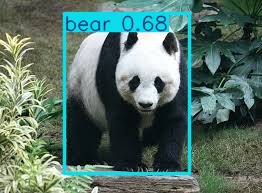

In [ ]:
Image.open(results[0].save_dir+"/panda.jpg")

In [ ]:
# plot on local machine
for i_r in results:
    im_array = i_r.cpu().numpy().plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image

# Key YOLO Prediction Parameters

This section describes some of the most important parameters used for making predictions with YOLO models during inference. These settings greatly influence the model's performance, accuracy, and speed.

### Inference Source Parameters
- **source**: Specifies the input data source, which could be an image path, video, directory, URL, or even a live stream. For example, `'image.jpg'`, `'path/to/video.mp4'`, or `0` (for webcam).
  
### Model Performance and Output
- **conf** (`0.25`): The minimum confidence threshold for predictions. Lowering this value can help detect more objects, but may increase false positives.
- **iou** (`0.7`): Intersection over Union (IoU) threshold for Non-Maximum Suppression (NMS), which controls the overlap between bounding boxes.
- **max_det** (`300`): Limits the number of detections per image to reduce computational overhead in dense scenes.
- **imgsz** (`640`): Defines the image size used during inference. Larger values improve accuracy but may reduce processing speed.

### Device and Resource Optimization
- **device** (`None`): Specify the device for inference, such as `cpu`, `cuda:0`, or a specific GPU.
- **half** (`False`): Enables half-precision (FP16) inference on GPUs for faster processing with minimal accuracy loss.
- **stream_buffer** (`False`): When set to `True`, frames are buffered for video streams, ensuring no frames are skipped. This can reduce real-time latency.
- **vid_stride** (`1`): Frame stride for video processing, allowing you to skip frames and speed up video inference.

### Advanced Features
- **augment** (`False`): Test-time augmentation for improving robustness in challenging conditions, which may slightly increase processing time.
- **agnostic_nms** (`False`): Class-agnostic NMS, merging overlapping boxes regardless of class, useful in complex multi-class scenarios.
- **retina_masks** (`False`): If segmentation is enabled, this improves mask resolution for more detailed outputs.
  
### Visualization and Output Formatting
- **show** (`False`): Displays the processed images or videos with annotations.
- **save** (`True`): Saves the output files (images or videos) to disk.
- **save_txt** (`False`): Saves detection results as a text file for further processing or evaluation.
- **save_conf** (`False`): Includes confidence scores when saving the text results.

These parameters offer flexibility in configuring YOLO predictions for different tasks, balancing between speed, accuracy, and resource usage. For more details on all settings, refer to the [Ultralytics documentation](https://docs.ultralytics.com/usage/cfg/#predict-settings).


### Train YOLOvX on custom dataset

In [ ]:
# Local machine
# The data directory is currently hard-coded, if you want to train in different location you need to change it:
#C:\Users\name\AppData\Roaming\Ultralytics\settings.yaml
# then you need to re-import it
#import ultralytics
#ultralytics.checks()
#from ultralytics import YOLO

In [ ]:
# Train YOLOvX on custume
#model = YOLO("yolo11n.yaml")  # build a new model from scratch
model = YOLO("yolo11n.pt")  # pretrained
#model = YOLO('custom_model.yaml')  # build a new model from scratch
# train the model cfg="conf.yaml" data="test.yaml", epochs=10, imgsz=320, batch=16, project="Labor", name="Test"
results=model.train(data="test.yaml", epochs=10, imgsz=160, batch=16, project="Labor", name="Test")

Ultralytics 8.3.7 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=test.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=160, save=True, save_period=-1, cache=False, device=None, workers=8, project=Labor, name=Test, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=

100%|██████████| 755k/755k [00:00<00:00, 112MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

train: Scanning coco128/labels/train2017... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<00:00, 1893.84it/s]

train: New cache created: coco128/labels/train2017.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.17 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]


Plotting labels to Labor/Test/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 160 train, 160 val
Using 2 dataloader workers
Logging results to Labor/Test
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      0.31G      1.831      3.506      1.396         71        160: 100%|██████████| 8/8 [00:03<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]


                   all        128        929      0.545      0.257      0.283      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10     0.292G      1.735      3.405      1.393        109        160: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]

                   all        128        929      0.486      0.259      0.278      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       0.3G       1.72      3.239      1.398        101        160: 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.40it/s]


                   all        128        929      0.521      0.258      0.283        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       0.3G      1.673      2.918       1.31         97        160: 100%|██████████| 8/8 [00:01<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.08it/s]


                   all        128        929       0.51      0.252      0.285      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10       0.3G      1.622      2.848      1.279         64        160: 100%|██████████| 8/8 [00:00<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.19it/s]


                   all        128        929      0.483      0.266      0.288      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       0.3G      1.658      2.734      1.285         89        160: 100%|██████████| 8/8 [00:00<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.86it/s]


                   all        128        929      0.481      0.269       0.29      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10     0.298G      1.577      2.368      1.285        116        160: 100%|██████████| 8/8 [00:00<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.77it/s]


                   all        128        929      0.498      0.283      0.295      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       0.3G      1.672      2.603      1.304         56        160: 100%|██████████| 8/8 [00:01<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all        128        929      0.505      0.273      0.297      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10     0.298G      1.551      2.312      1.242        119        160: 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.08it/s]


                   all        128        929      0.514      0.285        0.3      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10     0.298G      1.663      2.437      1.275         97        160: 100%|██████████| 8/8 [00:00<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.26it/s]


                   all        128        929      0.513       0.28      0.301      0.204

10 epochs completed in 0.010 hours.
Optimizer stripped from Labor/Test/weights/last.pt, 5.5MB
Optimizer stripped from Labor/Test/weights/best.pt, 5.5MB

Validating Labor/Test/weights/best.pt...
Ultralytics 8.3.7 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]


                   all        128        929      0.515      0.283      0.301      0.205
                person         61        254      0.424      0.402      0.397      0.242
               bicycle          3          6          0          0     0.0185     0.0166
                   car         12         46      0.185     0.0435     0.0278     0.0153
            motorcycle          4          5      0.593        0.6      0.716      0.554
              airplane          5          6      0.614      0.667      0.612      0.544
                   bus          5          7       0.73      0.571      0.588      0.497
                 train          3          3      0.314      0.314       0.39       0.19
                 truck          5         12          0          0     0.0579     0.0309
                  boat          2          6       0.57      0.333      0.375      0.242
         traffic light          4         14          1          0     0.0759     0.0497
             stop sig

## 4. Visualize results

All results are logged by default to `runs/detect/train`, with a new experiment directory created for each new training as `runs/detect/train2`, `runs/detect/train3`, etc.

or

with the predefined project="Labor", name="Test"

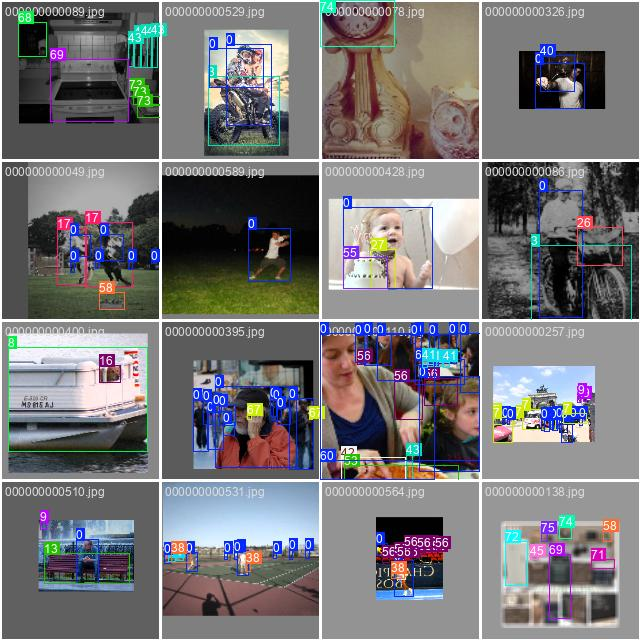

In [ ]:
 # train batch 0 mosaics and labels
Image.open(os.getcwd()+"/Labor/Test/train_batch0.jpg")

Training results are automatically logged to [Tensorboard](https://www.tensorflow.org/tensorboard) and [txt] as `results.txt`, which is plotted as `results.png` (below) after training completes. You can also plot any `results.txt` file manually.Good summary about the metrics (https://en.wikipedia.org/wiki/Precision_and_recall)

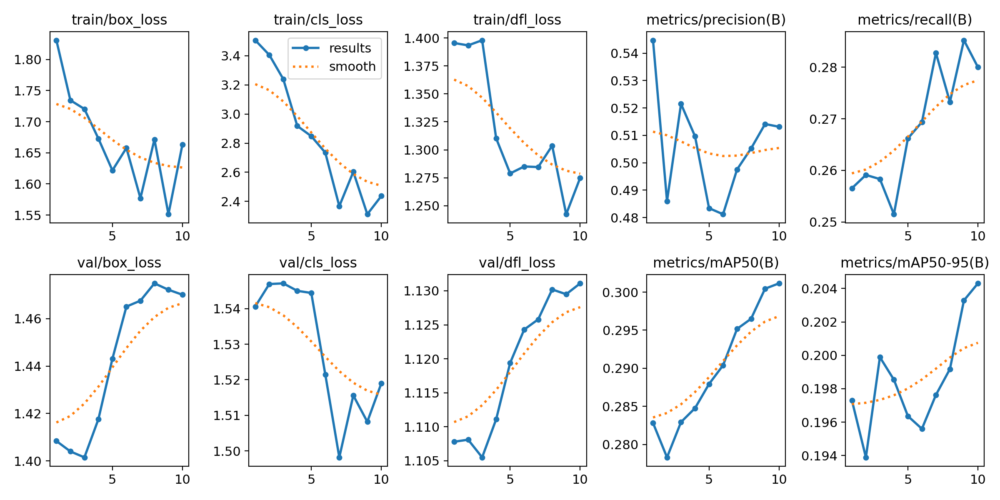

In [ ]:
Image.open(os.getcwd()+'/Labor/Test/results.png') # May not all of the metrics works in every version

### Metrics Reported in YOLO:
- **mAP@0.5**: Mean Average Precision at IoU=0.5
- **mAP@0.5:0.95**: Mean Average Precision averaged over IoU thresholds from 0.5 to 0.95
- **Precision**: Ratio of correct detections to total detections
- **Recall**: Ratio of correct detections to total true objects
- **F1-Score**: Harmonic mean of precision and recall

## 5. Usage

detect.py can be run on images and videos. The three most important parameters of the detect function are:
- the image size (it can be different from the training size, as we discussed),
- confidence level (estimated probability),
- IoU threshold (merge nearby predictions)

The prediction saved in **runs\detect\predict**

In [ ]:
results = model.predict(source=os.getcwd()+'/panda.jpg', imgsz= 320, conf=0.0001, iou=0.5, save = True)


image 1/1 /content/datasets/panda.jpg: 256x320 1 bear, 8 bananas, 1 couch, 16 potted plants, 1 bed, 51.1ms
Speed: 0.8ms preprocess, 51.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
Results saved to Labor/Test2


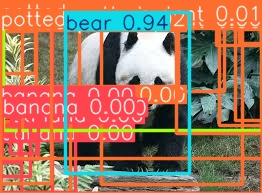

In [ ]:
Image.open(os.getcwd()+'/Labor/Test2/panda.jpg') # training on a small dataset may case worst results

In [ ]:
# plot on local machine
for r in results:
    im_array = r.cpu().numpy().plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image

# Test

In [ ]:
# Perform the test
testresults = model.val()  # Run validation/test to measure accuracy and mAP

Ultralytics 8.3.7 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.03it/s]


                   all        128        929      0.517      0.283      0.302      0.208
                person         61        254      0.443      0.417      0.401      0.244
               bicycle          3          6          0          0     0.0171     0.0154
                   car         12         46      0.184     0.0435     0.0279     0.0154
            motorcycle          4          5      0.592        0.6      0.691      0.533
              airplane          5          6      0.702      0.667      0.612      0.534
                   bus          5          7      0.712      0.571      0.588      0.497
                 train          3          3      0.332      0.332       0.39      0.191
                 truck          5         12          0          0     0.0581      0.031
                  boat          2          6      0.668      0.333      0.358      0.229
         traffic light          4         14          1          0      0.117     0.0726
             stop sig

# Key YOLO Training Parameters

These parameters are used during the training process of YOLO models, affecting how the model learns, its optimization strategy, and how resources are managed during training.

### Model Training and Optimization
- **epochs** (`100`): The number of complete passes through the training dataset. More epochs allow the model to learn better, but excessive training can lead to overfitting.
- **batch** (`16`): Specifies the number of images processed in one forward/backward pass. Can be manually set or adjusted automatically (`batch=-1` for 60% GPU memory usage).
- **lr0** (`0.01`): Initial learning rate for the optimizer. A crucial hyperparameter that dictates how quickly the model updates weights during training.
- **lrf** (`0.01`): Final learning rate as a fraction of the initial learning rate (`lr0`). Helps adjust the learning rate dynamically during training.
- **momentum** (`0.937`): Momentum factor for optimizers like SGD or Adam, which influences how much past gradients are incorporated in the current update.
- **weight_decay** (`0.0005`): L2 regularization to penalize large weights, preventing overfitting and helping generalize better.
- **optimizer** (`'auto'`): Specifies which optimizer to use (e.g., SGD, Adam, AdamW https://paperswithcode.com/method/adamw). The `'auto'` option selects the optimizer based on the task.
  
### Learning Rate Warmup
- **warmup_epochs** (`3.0`): Number of initial epochs to gradually increase the learning rate from a very low value to stabilize early training.
- **warmup_momentum** (`0.8`): Momentum value during the warmup phase, which gradually transitions to the final momentum setting.
- **warmup_bias_lr** (`0.1`): Learning rate for bias parameters during the warmup phase, which helps stabilize training.

### Training Behavior and Regularization
- **amp** (`True`): Enables automatic mixed precision training, which can reduce memory usage and speed up training without sacrificing accuracy.
- **freeze** (`None`): Freezes the first N layers or specific layers, preventing them from updating during training. Useful for transfer learning or fine-tuning.
- **dropout** (`0.0`): Dropout rate, used to randomly disable some units in the network to prevent overfitting.
- **label_smoothing** (`0.0`): Applies softening to the target labels, making the model less confident about its predictions, which can improve generalization.
  
### Dataset and Input Processing
- **data** (`None`): Path to the dataset used for training. Must be specified for custom training.
- **imgsz** (`640`): Defines the input image size. Larger images may improve accuracy but increase computational load.
- **rect** (`False`): When enabled, processes images in rectangular mode instead of square, improving efficiency for datasets with images of varying aspect ratios.

### Early Stopping and Checkpoints
- **patience** (`100`): Number of epochs to wait for improvements before stopping training early (early stopping).
- **resume** (`False`): If set to `True`, resumes training from the last saved checkpoint, continuing from where it left off.
- **save_period** (`-1`): Defines how often model checkpoints should be saved during training (e.g., every N epochs).

### Loss Function Components
- **box** (`7.5`): Loss coefficient for bounding box regression, affecting how much emphasis is placed on accurately predicting object locations.
- **cls** (`0.5`): Loss coefficient for classification, determining the importance of correct object class predictions.
- **dfl** (`1.5`): Loss coefficient helps with class inballance:
Hossain, Md Sazzad, et al. “Dual Focal Loss to Address Class Imbalance in Semantic Segmentation.” Neurocomputing, vol. 462, Elsevier BV, Oct. 2021, pp. 69–87, doi:10.1016/j.neucom.2021.07.055.
  
### Miscellaneous
- **val** (`True`): Enables validation during training, allowing performance tracking on a validation set.
- **overlap_mask** (`True`): Controls whether segmentation masks can overlap during training.
- **mask_ratio** (`4`): Downsampling ratio for segmentation masks, determining mask resolution during training.

These parameters allow fine-tuning and control over the training process for YOLO models, providing flexibility for various use cases like object detection, segmentation, and more.


### Data Augmentation


| **Argument**       | **Type** | **Default** | **Range**        | **Description**                                                                                                                                                          |
|--------------------|----------|-------------|------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **hsv_h**          | float    | 0.015       | 0.0 - 1.0        | Adjusts the hue of the image by a fraction of the color wheel, introducing color variability. Helps the model generalize across different lighting conditions.            |
| **hsv_s**          | float    | 0.7         | 0.0 - 1.0        | Alters the saturation of the image by a fraction, affecting the intensity of colors. Useful for simulating different environmental conditions.                            |
| **hsv_v**          | float    | 0.4         | 0.0 - 1.0        | Modifies the value (brightness) of the image by a fraction, helping the model to perform well under various lighting conditions.                                           |
| **degrees**        | float    | 0.0         | -180 - +180      | Rotates the image randomly within the specified degree range, improving the model's ability to recognize objects at various orientations.                                  |
| **translate**      | float    | 0.1         | 0.0 - 1.0        | Translates the image horizontally and vertically by a fraction of the image size, aiding in learning to detect partially visible objects.                                  |
| **scale**          | float    | 0.5         | >=0.0            | Scales the image by a gain factor, simulating objects at different distances from the camera.                                                                             |
| **shear**          | float    | 0.0         | -180 - +180      | Shears the image by a specified degree, mimicking the effect of objects being viewed from different angles.                                                               |
| **perspective**    | float    | 0.0         | 0.0 - 0.001      | Applies a random perspective transformation to the image, enhancing the model's ability to understand objects in 3D space.                                                |
| **flipud**         | float    | 0.0         | 0.0 - 1.0        | Flips the image upside down with the specified probability, increasing the data variability without affecting the object's characteristics.                               |
| **fliplr**         | float    | 0.5         | 0.0 - 1.0        | Flips the image left to right with the specified probability, useful for learning symmetrical objects and increasing dataset diversity.                                    |
| **bgr**            | float    | 0.0         | 0.0 - 1.0        | Flips the image channels from RGB to BGR with the specified probability, useful for increasing robustness to incorrect channel ordering.                                   |
| **mosaic**         | float    | 1.0         | 0.0 - 1.0        | Combines four training images into one, simulating different scene compositions and object interactions. Highly effective for complex scene understanding.                 |
| **mixup**          | float    | 0.0         | 0.0 - 1.0        | Blends two images and their labels, creating a composite image. Enhances the model's ability to generalize by introducing label noise and visual variability.              |
| **copy_paste**     | float    | 0.0         | 0.0 - 1.0        | Copies objects from one image and pastes them onto another, useful for increasing object instances and learning object occlusion.                                          |
| **copy_paste_mode**| str      | flip        | -                | Copy-Paste augmentation method selection among the options of ("flip", "mixup").                                                                                          |
| **auto_augment**   | str      | randaugment | -                | Automatically applies a predefined augmentation policy (randaugment, autoaugment, augmix-https://paperswithcode.com/paper/augmix-a-simple-data-processing-method-to), optimizing for classification tasks by diversifying the visual features.        |
| **erasing**        | float    | 0.4         | 0.0 - 0.9        | Randomly erases a portion of the image during classification training, encouraging the model to focus on less obvious features for recognition.                           |
| **crop_fraction**  | float    | 1.0         | 0.1 - 1.0        | Crops the classification image to a fraction of its size to emphasize central features and adapt to object scales, reducing background distractions.                      |
